# CS 6220 Data Mining — Assignment 2

# Exploring Data with Pandas

In [1]:
import pandas as pd

#Load the data
red_wine_path = 'wine+quality/winequality-red.csv'
white_wine_path = 'wine+quality/winequality-white.csv'

# Load the datasets into pandas DataFrames
red_wine_df = pd.read_csv(red_wine_path, sep=';')
white_wine_df = pd.read_csv(white_wine_path, sep=';')

# Add a new column to identify the wine type
red_wine_df['wineType'] = 'red'
white_wine_df['wineType'] = 'white'

# Concatenate the two DataFrames into a single DataFrame
combined_wine_df = pd.concat([red_wine_df, white_wine_df], ignore_index=True)

# Display the first few rows of the combined DataFrame
combined_wine_df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wineType
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


The combined dataset has been successfully loaded and includes the wine data with columns such as fixed acidity, volatile acidity, citric acid, etc., along with a new column identifying the wine type (red or white).

# 1.1 Summary Statistics

In [5]:
# Compute summary statistics for numeric columns only
summary_stats = combined_wine_df.describe()

# Calculate the range (max - min) for numeric columns and add to the summary
summary_stats.loc['range'] = summary_stats.loc['max'] - summary_stats.loc['min']

# Add variance to the summary statistics for numeric columns only
summary_stats.loc['variance'] = combined_wine_df.var(numeric_only=True)

# Display the summary statistics
print(summary_stats)

          fixed acidity  volatile acidity  citric acid  residual sugar  \
count       6497.000000       6497.000000  6497.000000     6497.000000   
mean           7.215307          0.339666     0.318633        5.443235   
std            1.296434          0.164636     0.145318        4.757804   
min            3.800000          0.080000     0.000000        0.600000   
25%            6.400000          0.230000     0.250000        1.800000   
50%            7.000000          0.290000     0.310000        3.000000   
75%            7.700000          0.400000     0.390000        8.100000   
max           15.900000          1.580000     1.660000       65.800000   
range         12.100000          1.500000     1.660000       65.200000   
variance       1.680740          0.027105     0.021117       22.636696   

            chlorides  free sulfur dioxide  total sulfur dioxide      density  \
count     6497.000000          6497.000000           6497.000000  6497.000000   
mean         0.056034  

This summary includes all the required statistics. 

# 1.2 Data Visualization

# 1. Histograms for Each Feature

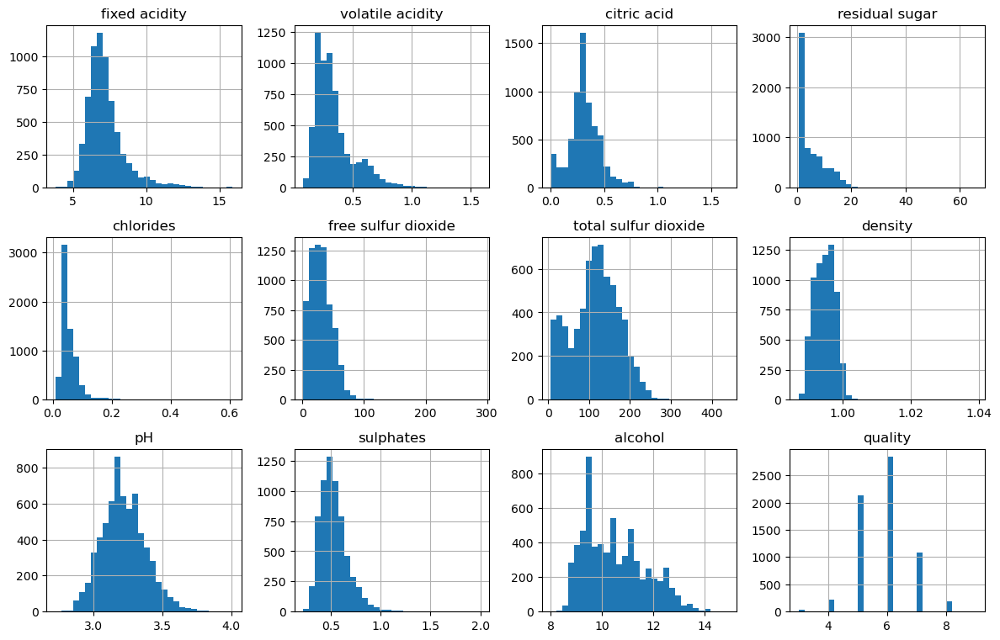

In [10]:
import matplotlib.pyplot as plt

# Create histograms for each numeric feature
combined_wine_df.hist(bins=30, figsize=(12, 10), layout=(4, 4))
plt.tight_layout()
plt.show()


Histograms are useful for visualizing the distribution of data.

# 2. Box Plots for Each Feature

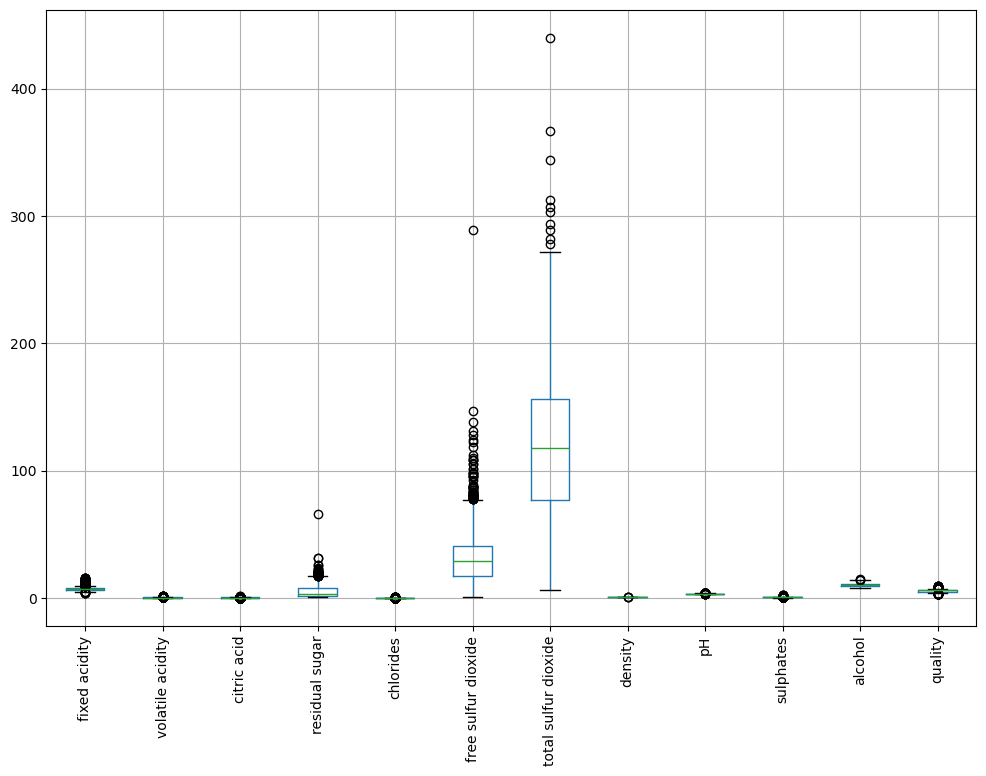

In [14]:
# Create box plots for each numeric feature
plt.figure(figsize=(12, 8))
combined_wine_df.boxplot()
plt.xticks(rotation=90)
plt.show()


# 3. Pairwise Scatter Plots

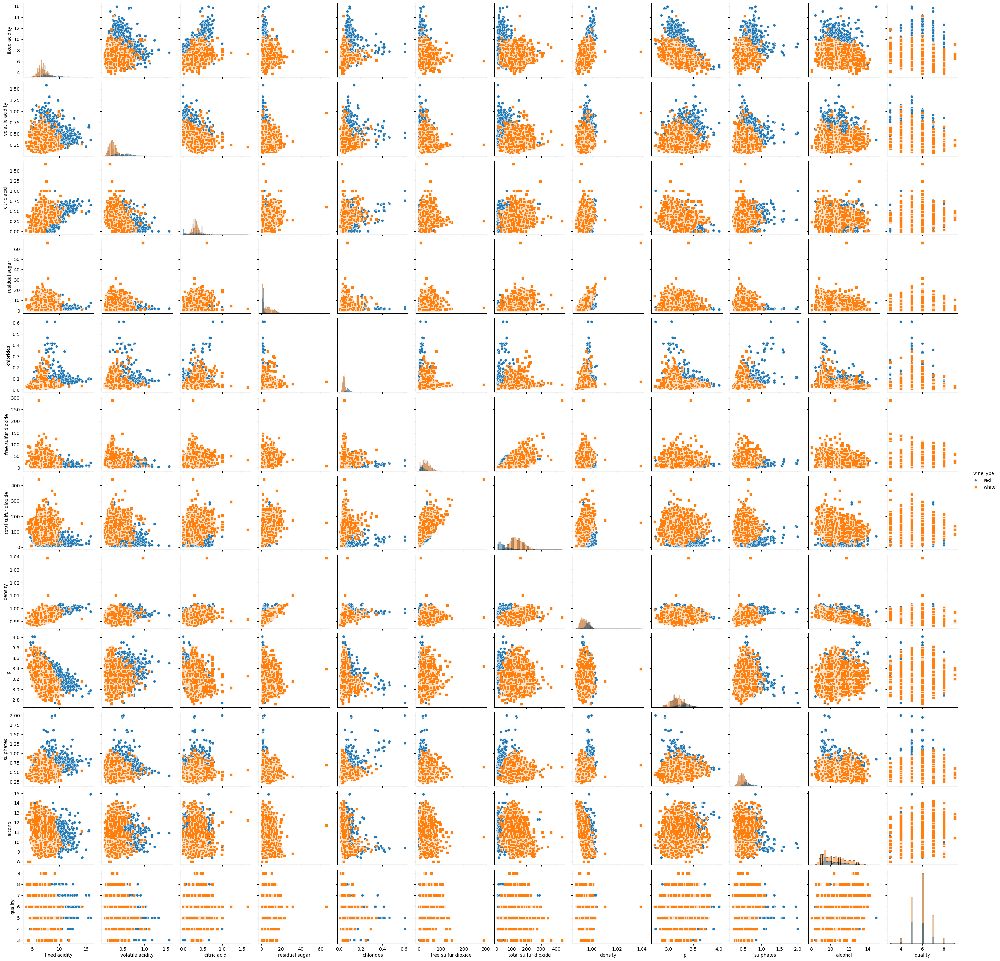

In [18]:
import seaborn as sns

# Create pairwise scatter plots for all numeric features
sns.pairplot(combined_wine_df, hue='wineType', markers=["o", "s"], diag_kind="hist")
plt.show()


# 4. Class-wise Visualizations

We will split the dataset into red and white wines and then create pairwise plots for each class separately.

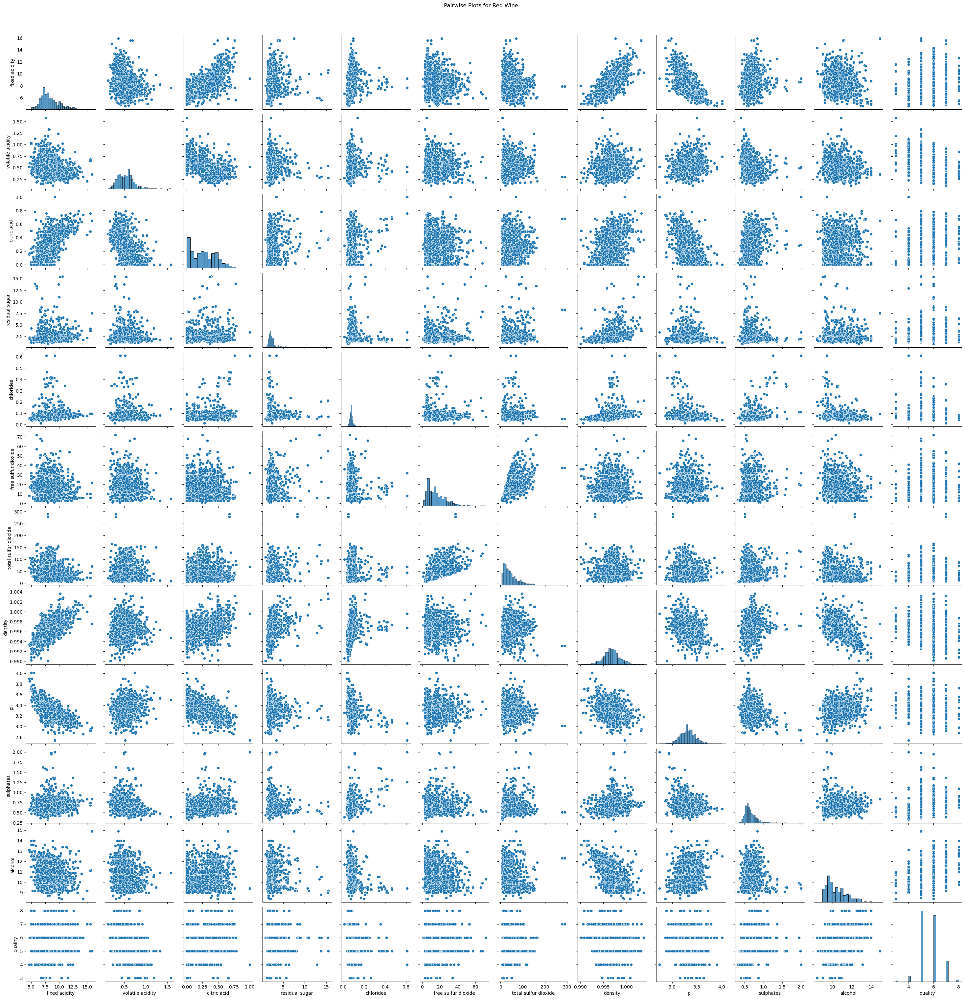

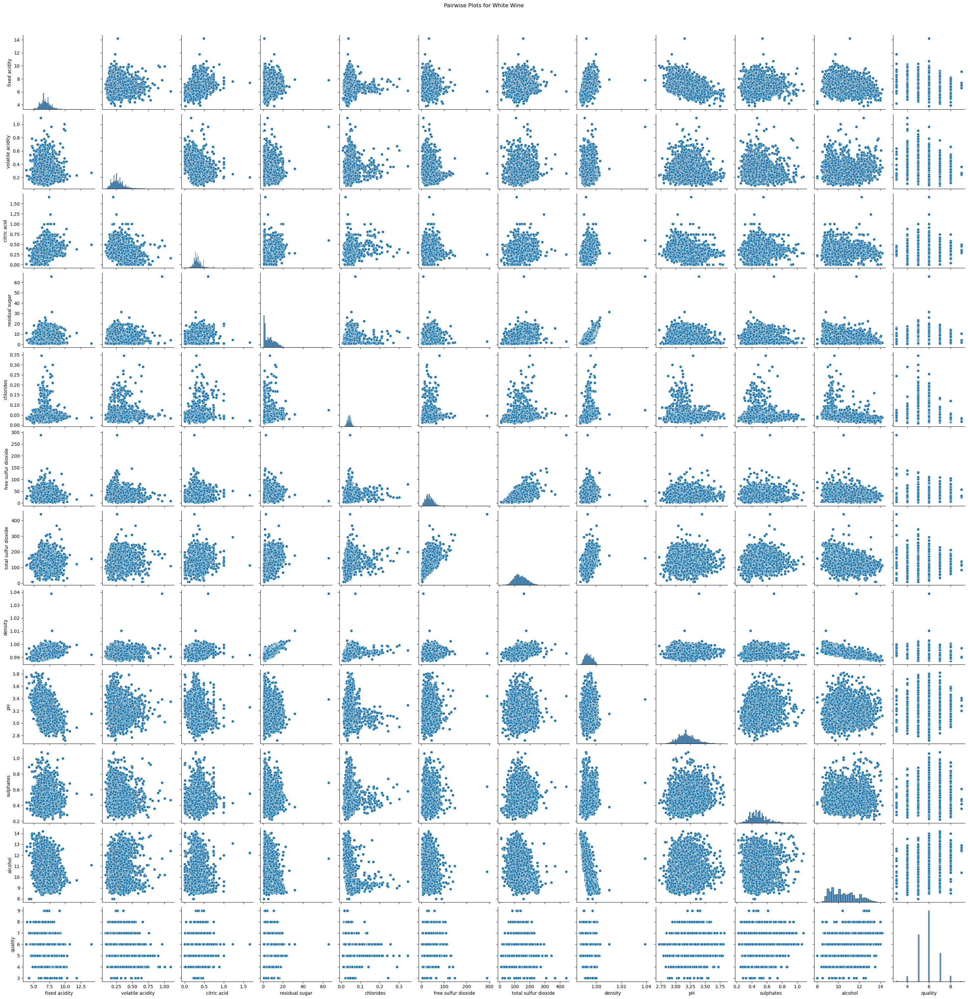

In [21]:
# Separate the dataset into red and white wines
red_wine_data = combined_wine_df[combined_wine_df['wineType'] == 'red']
white_wine_data = combined_wine_df[combined_wine_df['wineType'] == 'white']

# Pairwise plot for red wine
sns.pairplot(red_wine_data, diag_kind='hist')
plt.suptitle("Pairwise Plots for Red Wine", y=1.02)
plt.show()

# Pairwise plot for white wine
sns.pairplot(white_wine_data, diag_kind='hist')
plt.suptitle("Pairwise Plots for White Wine", y=1.02)
plt.show()


Comparing Red and White Wine Pairs

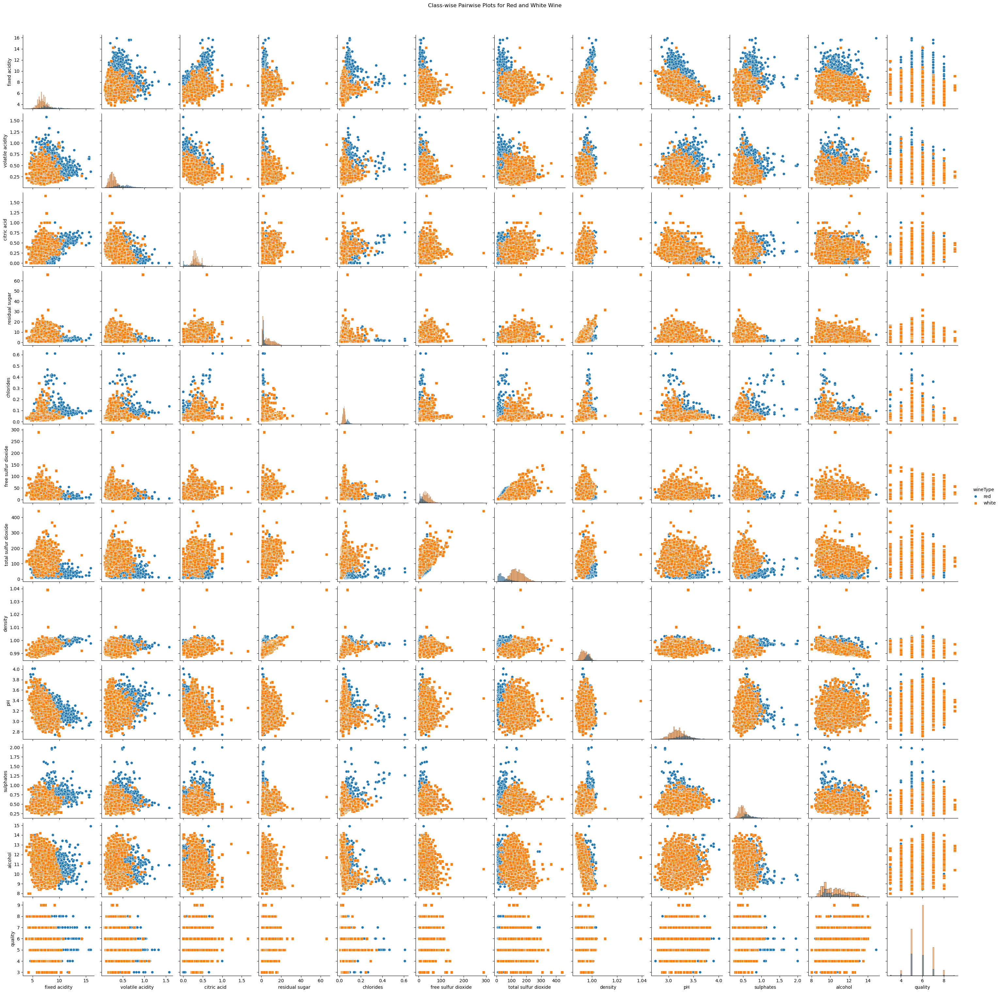

In [27]:
# Pairwise plot for both red and white wine with color distinction
sns.pairplot(combined_wine_df, hue='wineType', diag_kind='hist', markers=["o", "s"])
plt.suptitle("Class-wise Pairwise Plots for Red and White Wine", y=1.02)
plt.show()


This uses the hue option to show the class-wise distinction in a single plot.

Lets check "if there are n features in the dataset, there should be nC2 plots"

In [31]:
import itertools

# List of feature names (excluding 'wineType' or any categorical features)
features = combined_wine_df.columns[:-1]  # Exclude the wineType column

# Get all possible pairs of features (nC2)
pairs = list(itertools.combinations(features, 2))

# Display number of combinations (nC2)
print(f"Total pairwise plots (nC2): {len(pairs)}")

# Display the feature pairs
print(pairs)


Total pairwise plots (nC2): 66
[('fixed acidity', 'volatile acidity'), ('fixed acidity', 'citric acid'), ('fixed acidity', 'residual sugar'), ('fixed acidity', 'chlorides'), ('fixed acidity', 'free sulfur dioxide'), ('fixed acidity', 'total sulfur dioxide'), ('fixed acidity', 'density'), ('fixed acidity', 'pH'), ('fixed acidity', 'sulphates'), ('fixed acidity', 'alcohol'), ('fixed acidity', 'quality'), ('volatile acidity', 'citric acid'), ('volatile acidity', 'residual sugar'), ('volatile acidity', 'chlorides'), ('volatile acidity', 'free sulfur dioxide'), ('volatile acidity', 'total sulfur dioxide'), ('volatile acidity', 'density'), ('volatile acidity', 'pH'), ('volatile acidity', 'sulphates'), ('volatile acidity', 'alcohol'), ('volatile acidity', 'quality'), ('citric acid', 'residual sugar'), ('citric acid', 'chlorides'), ('citric acid', 'free sulfur dioxide'), ('citric acid', 'total sulfur dioxide'), ('citric acid', 'density'), ('citric acid', 'pH'), ('citric acid', 'sulphates'), ('

this dataset has 12 features, then the total number of pairwise scatter plots will be nC2 = 66

# 1.3 Conceptual Questions

Q1. How many features are there? What are the types of the features (e.g., numeric, nominal, discrete, continuous)?

The combined wine dataset includes the following features: fixed acidity, volatile acidity, citric acid, residual sugar, chlorides, free sulfur dioxide, total sulfur dioxide, density, pH, sulphates, alcohol, quality, and wineType (introduced for classification purposes). There are 13 features in total. However, since wineType is a categorical variable used to differentiate between red and white wines, it isn't included in mathematical operations like summary statistics or correlations. The other features are numeric and used for analysis.

The dataset consists of 13 features, both numeric and categorical.
The numeric features can be divided into continuous and discrete categories. 
Continuous features, which can take any value within a range, include fixed acidity, volatile acidity, citric acid, residual sugar, chlorides, density, pH, sulphates, and alcohol. 
Discrete features, which take distinct values, include free sulfur dioxide, total sulfur dioxide, and quality. Although quality is numeric, it often functions like a categorical variable as it rates the wine on a scale of 0 to 10. 
Additionally, there is one nominal feature, wineType, a categorical variable distinguishing red from white wine. Understanding this mix of feature types aids in applying appropriate analytical and modeling techniques for continuous, discrete, and categorical data.

_____________________________________________________________________________________________________________________________________________

Q2. What can you conclude from the histograms about the distribution of the features in the dataset? Are there any features that are approximately normally distributed? Are there any features that are highly skewed?

Based on the histograms, it’s evident that the features in the dataset display diverse distribution patterns:

1. Approximately Normally Distributed Features:
* Features like pH and alcohol exhibit distributions that are roughly normal, though not perfectly symmetrical. These features display central peaks with tails on both sides, resembling a bell-shaped curve.

2. Highly Skewed Features:
Several features are right-skewed, meaning most values are concentrated on the lower end with a long tail stretching to the right. Examples include:
* Residual sugar: This feature is strongly right-skewed, suggesting most wines have low residual sugar, with a few having much higher levels.
* Chlorides: Similarly, this feature is right-skewed, with most wines showing low chloride content.
* Free sulfur dioxide and total sulfur dioxide: Both these features are right-skewed, indicating that most wines contain low levels of sulfur dioxide, but a small number have much higher amounts.
  
3. Multi-modal Distributions:
* The quality feature exhibits a multi-modal distribution, with several peaks corresponding to different wine quality ratings.
  
In summary, the dataset presents a combination of approximately normal distributions (e.g., pH and alcohol) and heavily skewed distributions (e.g., residual sugar, chlorides, sulfur dioxide). These skewed features may suggest the presence of outliers or extreme values, which could influence the results of data analysis and modeling.

_____________________________________________________________________________________________________________________________________________

Q3. Based on the box plots, are there any features that appear to have many outliers? Arethere any features that appear to have a similar spread of values across different qualityratings? Are there any features that appear to have different spreads of values acrossdifferent quality ratings?

Based on the box plot, several observations can be made:

1. Features with Many Outliers:
Residual sugar, chlorides, free sulfur dioxide, and total sulfur dioxide all exhibit a significant number of outliers. The presence of these outliers suggests that for most wines, these features remain within a certain range, but there are some wines that have unusually high values, pulling the whiskers of the box plots upward. For example:
* Residual sugar has a large number of outliers, indicating that a few wines have much higher sugar content than the majority.
* Chlorides also shows outliers, indicating higher levels of chlorides in some wines.
* Free sulfur dioxide and total sulfur dioxide display particularly large spreads and numerous outliers, indicating variability in the amounts of sulfur dioxide used in the wines.

2. Features with Similar Spread Across Quality Ratings:
* Fixed acidity, volatile acidity, citric acid, and pH seem to have relatively consistent spreads across different wines (which could correspond to different quality ratings). The box plots for these features are compact, with minimal variation or outliers, suggesting that these features do not differ significantly across the range of wine quality scores.
  
3. Features with Different Spreads Across Quality Ratings:
* Free sulfur dioxide and total sulfur dioxide show very different spreads, with much more variability compared to other features. This suggests that the amount of sulfur dioxide used in wines varies widely across different wines, potentially contributing to different wine quality ratings. Wines with lower or higher sulfur dioxide levels may correspond to different quality ratings, making these features more influential in determining the quality of the wine.
* Residual sugar also exhibits a wide spread and outliers, which suggests that wines with different levels of residual sugar may be rated differently in terms of quality.
  
Conclusion:
* Features like residual sugar, chlorides, and sulfur dioxide have many outliers, indicating that some wines have extreme values for these attributes.
* Features such as fixed acidity, volatile acidity, citric acid, and pH seem to have consistent distributions across different wines, potentially having less influence on wine quality differentiation.
* Features like sulfur dioxide and residual sugar exhibit different spreads, indicating that they may play a larger role in varying quality ratings.

_____________________________________________________________________________________________________________________________________________

Q4. Based on the pairwise plots, which features appear to be highly correlated? Are there any features that do not appear to be correlated with any other features?

From the pairwise plots, several patterns of correlation can be observed between features:

1. Highly Correlated Features:

* Density vs. Residual Sugar: There is a noticeable positive correlation between density and residual sugar. As residual sugar increases, density tends to increase as well. This makes sense since sugar adds mass to the liquid, thereby increasing its density.
* Free Sulfur Dioxide vs. Total Sulfur Dioxide: A strong positive correlation exists between free sulfur dioxide and total sulfur dioxide, which is expected because total sulfur dioxide includes free sulfur dioxide as a component. The scatter plot shows that as free sulfur dioxide increases, total sulfur dioxide also increases.
* Alcohol vs. Density: There seems to be a negative correlation between alcohol and density. As alcohol content increases, the density tends to decrease, which is typical for alcoholic beverages, as alcohol has a lower density than water.

2. Features with Little to No Correlation:
* Quality vs. Fixed Acidity: There seems to be little or no clear correlation between quality and fixed acidity, as the points are spread out without a discernible pattern. This suggests that the level of fixed acidity does not significantly impact wine quality.
* Quality vs. Volatile Acidity: Similarly, volatile acidity does not show a strong linear correlation with quality, though there might be a slight negative trend where higher volatile acidity is associated with lower quality.
* pH vs. Most Features: The pH feature does not show strong correlations with many other features. It appears fairly scattered across the pairwise plots, suggesting it does not have a strong linear relationship with other variables in the dataset.

Conclusion:
* Strong positive correlations are seen between density and residual sugar and between free sulfur dioxide and total sulfur dioxide.
* Alcohol and density exhibit a negative correlation.
* Features like pH, fixed acidity, and volatile acidity do not show strong correlations with other features, particularly quality, indicating they may not be key predictors of wine quality in this dataset.
  
These observations help identify which features are likely to influence each other and which are independent, providing insights for further analysis and modeling.

_____________________________________________________________________________________________________________________________________________

Q5. Based on the class-wise visualizations, are there any pairs of features that appear to be more correlated for certain wine types than for others?

Based on the class-wise pairwise plots, several feature pairs show distinct correlation patterns between the red and white wines:

1. Density vs. Residual Sugar:
The correlation between density and residual sugar appears to be stronger for white wine than for red wine. In white wines, as residual sugar increases, the density also increases more noticeably, forming a clearer trend. For red wines, the pattern is less pronounced, suggesting that other factors may also influence density in red wines.
2. Alcohol vs. Density:
There seems to be a negative correlation between alcohol and density for both red and white wines. However, the correlation is more distinct in white wines. In white wines, higher alcohol content is more strongly associated with lower density, while in red wines, the relationship is less pronounced but still present.
3. Free Sulfur Dioxide vs. Total Sulfur Dioxide:
Both wine types show a strong positive correlation between free sulfur dioxide and total sulfur dioxide. However, the correlation appears to be slightly tighter for white wine, indicating that sulfur dioxide levels are more consistently controlled in white wines compared to red wines, where there is more variability.
4. Volatile Acidity vs. Quality:
For red wine, there seems to be a slight negative correlation between volatile acidity and quality, where higher volatile acidity is associated with lower quality ratings. This relationship is not as clear for white wine, suggesting that volatile acidity might play a more significant role in determining the quality of red wines than white wines.

Conclusion:
* The correlation between density and residual sugar is stronger in white wines, while the correlation between alcohol and density is also more pronounced in white wines.
* Free sulfur dioxide and total sulfur dioxide are correlated in both wine types, but the relationship is tighter for white wines.
* Volatile acidity seems to impact the quality of red wines more than white wines.
These observations suggest that certain features influence the characteristics of red and white wines differently, which could be important when modeling or predicting wine quality based on these attributes.

# 2 Forest Fires Dataset

# 2.1 Summary Statistics

In [52]:
import pandas as pd

# Load the dataset 
df = pd.read_csv('forest+fires/forestfires.csv')

# Define a function to calculate all required statistics
def compute_summary_statistics(df):
    stats = pd.DataFrame()
    
    # Minimum value
    stats['min'] = df.min()
    
    # Maximum value
    stats['max'] = df.max()
    
    # Mean
    stats['mean'] = df.mean()
    
    # Range (max - min)
    stats['range'] = stats['max'] - stats['min']
    
    # Standard deviation
    stats['std'] = df.std()
    
    # Variance
    stats['variance'] = df.var()
    
    # Count
    stats['count'] = df.count()
    
    # 25th, 50th (median), and 75th percentiles
    stats['25%'] = df.quantile(0.25)
    stats['50%'] = df.quantile(0.50)
    stats['75%'] = df.quantile(0.75)
    
    return stats

# Compute summary statistics
summary_stats = compute_summary_statistics(df.select_dtypes(include=[float, int]))  # only consider numerical columns

# Display the summary statistics
summary_stats


,min,max,mean,range,std,variance,count,25%,50%,75%
X,1.0,9.00,4.669246,8.00,2.313778,5.353568,517,3.0,4.00,7.00
Y,2.0,9.00,4.299807,7.00,1.229900,1.512655,517,4.0,4.00,5.00
FFMC,18.7,96.20,90.644681,77.50,5.520111,30.471624,517,90.2,91.60,92.90
DMC,1.1,291.30,110.872340,290.20,64.046482,4101.951889,517,68.6,108.30,142.40
DC,7.9,860.60,547.940039,852.70,248.066192,61536.835467,517,437.7,664.20,713.90
ISI,0.0,56.10,9.021663,56.10,4.559477,20.788832,517,6.5,8.40,10.80
temp,2.2,33.30,18.889168,31.10,5.806625,33.716898,517,15.5,19.30,22.80
RH,15.0,100.00,44.288201,85.00,16.317469,266.259802,517,33.0,42.00,53.00
wind,0.4,9.40,4.017602,9.00,1.791653,3.210019,517,2.7,4.00,4.90
rain,0.0,6.40,0.021663,6.40,0.295959,0.087592,517,0.0,0.00,0.00


# 2.2 Data Visualization

In [55]:

import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset (ensure that the dataset path is correct)
df = pd.read_csv('forest+fires/forestfires.csv')



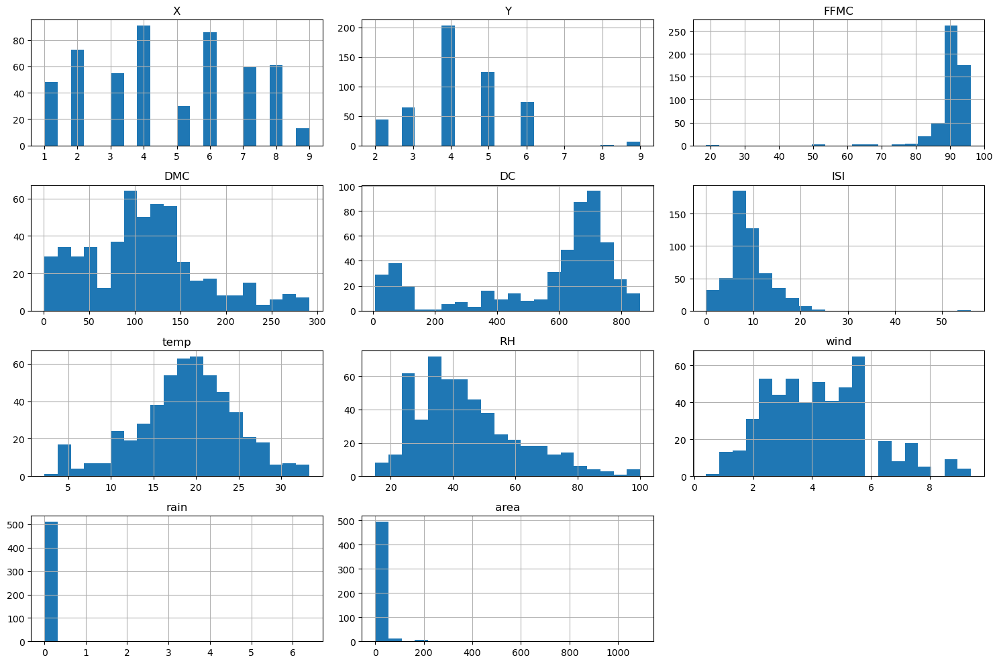

In [57]:
import matplotlib.pyplot as plt
import seaborn as sns

df.hist(figsize=(15, 10), bins=20)
plt.tight_layout()
plt.show()


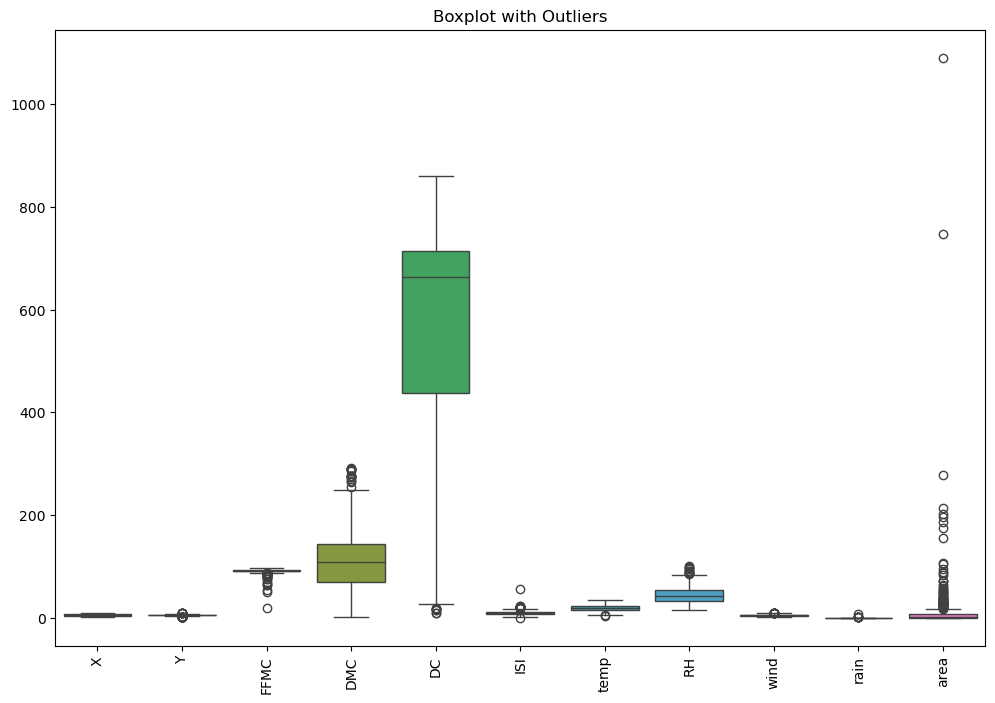

In [59]:
# Creating boxplot with outliers
plt.figure(figsize=(12, 8))
sns.boxplot(data=df)
plt.title("Boxplot with Outliers")
plt.xticks(rotation=90)
plt.show()



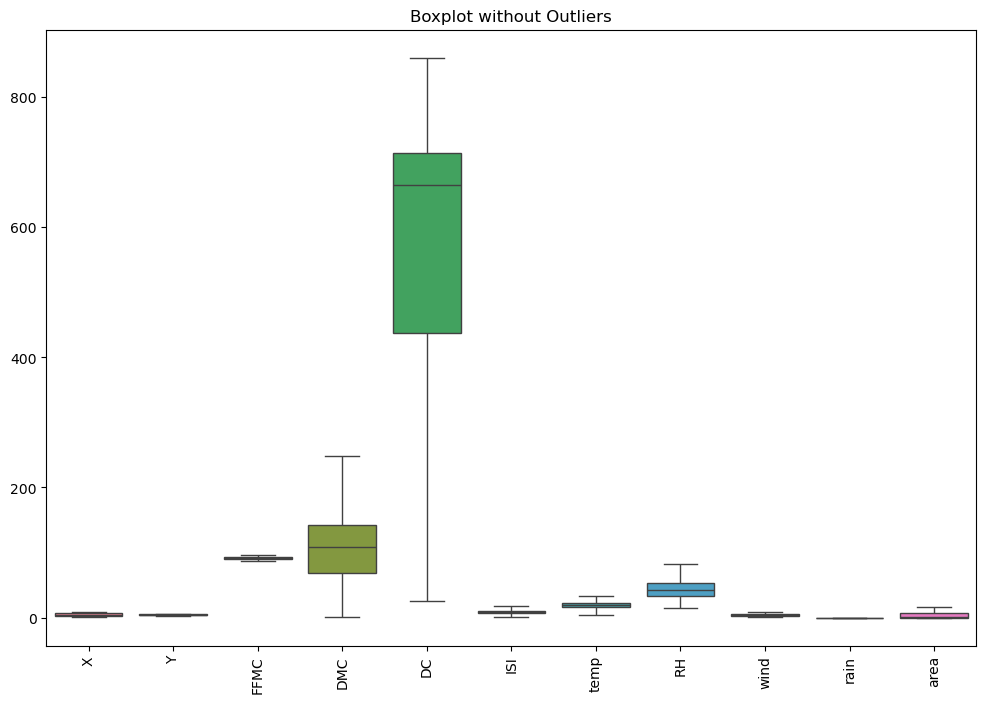

In [61]:
# Creating boxplot without outliers (removing outliers using showfliers=False)
plt.figure(figsize=(12, 8))
sns.boxplot(data=df, showfliers=False)
plt.title("Boxplot without Outliers")
plt.xticks(rotation=90)
plt.show()


# 2.3 Conceptual Questions

Q1. From the boxplot without outliers, which features has a significantly different distribution from others? Why?

From the boxplot without outliers, the feature that stands out as having a significantly different distribution from others is DC (Drought Code). Here are the reasons:
* Range and Scale: The DC variable has a much wider range and higher values compared to the other features. While most of the other features remain in the range of 0–150, DC extends well beyond 600, making its scale noticeably different.
* Spread: The interquartile range (IQR) for DC is significantly larger than other features, indicating a higher variance. This suggests more variability in DC values compared to others.
* Skewness: The feature area has some visible skewness even without outliers, but its range is small relative to DC. This makes DC the most prominent feature in terms of distribution differences.
In summary, the DC feature exhibits both a broader range and a larger variability, which sets it apart from other features. This could be due to its sensitivity to long-term drought conditions, leading to more extreme values in this variable compared to others like wind, temperature, or rain.

_____________________________________________________________________________________________________________________________________________

Q2. What does the outlier in the features mean? If you remove the outliers from the dataset,what problems might arise?

Outliers in a dataset are data points that significantly differ from other observations. In this dataset, outliers may represent extreme or rare events, such as very high temperatures, wind speeds, or large areas affected by fire. These outliers can be critical indicators of exceptional conditions (e.g., unusual weather patterns leading to extreme fire sizes or extreme drought conditions). Here’s what the outliers in the features could mean:

Extreme Events:
* Area: Large forest fires (outliers) might represent rare but important events where a large portion of the forest was affected.
* Wind: Very high wind speeds could contribute to extreme fire conditions by spreading flames quickly, leading to unusual fire behavior.
* Temperature: Outliers in temperature could indicate exceptionally hot days, which can lead to fire outbreaks.
* Rain: Very low or high amounts of rainfall could either mitigate or exacerbate fire conditions.
* DC (Drought Code): Outliers here represent extreme drought conditions, which make forests more susceptible to fires.

Potential Problems if outliers are removed:
* Loss of Important Information: Outliers often represent critical extreme events that may be key to understanding the factors contributing to large-scale fires. By removing them, you might lose valuable insights into the conditions that lead to major incidents.
* Bias in Model Training:Removing outliers can bias the dataset toward "normal" conditions, potentially under-representing the severity of rare but impactful events. This could lead to underfitting in models used for predicting rare but important events, such as extreme fires.
* Skewed Distribution: The removal of outliers may make distributions appear more normal, but it can also distort the real variability in the data, especially if these outliers are legitimate extreme events rather than noise.
* Generalization Issues: If outliers are removed, models trained on the dataset may not generalize well to real-world scenarios, especially when faced with extreme conditions that were removed during training. This can result in poor performance in predicting large or catastrophic fires.

It may be appropriate to remove outliers if they are the result of data entry errors, sensor malfunctions, or other noise that doesn't represent real phenomena. However, if the outliers are meaningful (such as extreme weather conditions), they should be retained to ensure the model can predict such events accurately.
In conclusion, removing outliers can simplify the data and improve certain model performances, but it can also lead to the loss of crucial information about extreme events, which are often the most important for predicting severe outcomes like large forest fires.

_____________________________________________________________________________________________________________________________________________

Q3. Create a histogram for only FFMC after removing all the values outside of range [88, 96].

To create a histogram for the FFMC feature after removing all values outside the range [88, 96], can be done by filtering the data accordingly and then use matplotlib or seaborn to plot the histogram.

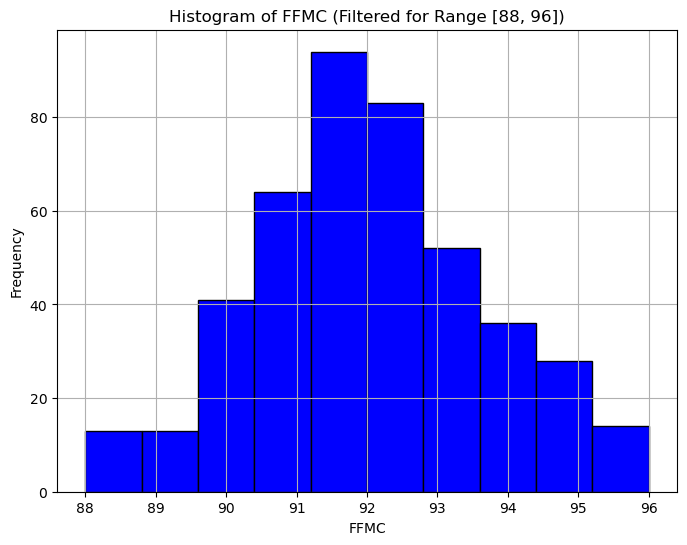

In [72]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming the dataframe is already loaded into a variable named df

# Filter the dataset for FFMC values within the range [88, 96]
filtered_ffmc = df[(df['FFMC'] >= 88) & (df['FFMC'] <= 96)]

# Plot the histogram for the filtered FFMC values
plt.figure(figsize=(8,6))
plt.hist(filtered_ffmc['FFMC'], bins=10, color='blue', edgecolor='black')
plt.title('Histogram of FFMC (Filtered for Range [88, 96])')
plt.xlabel('FFMC')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


The histogram for the FFMC feature, after filtering values within the range [88, 96], provides a focused visualization of the distribution of fire weather conditions in this specific range. By removing values outside this interval, we narrow down the dataset to reflect instances where fire weather conditions are moderate to high. The FFMC index (Fine Fuel Moisture Code) generally indicates the moisture content in fine fuels such as grass and leaves; a higher FFMC value suggests that the fuels are drier and more likely to ignite.
In this filtered dataset, the histogram visually displays how frequently specific FFMC values within the range [88, 96] occur. The use of 10 bins ensures that the data is broken into equal intervals, making it easier to observe the concentration of FFMC values within this range. This can help identify trends or patterns in fire-prone conditions in the dataset. Additionally, this specific range may reflect high fire risk scenarios, as these values indicate relatively dry fuel conditions. By narrowing the range, we also exclude potential extreme values (outliers) that could otherwise skew the overall interpretation of the fire risk represented by FFMC. This type of focused analysis can be useful when examining particular conditions for practical fire risk management or prevention measures.

_____________________________________________________________________________________________________________________________________________

Q4. What distribution does the new histogram follow?

The new histogram of FFMC values, after filtering for the range [88, 96], follows a roughly normal distribution (bell-shaped curve). The frequency of values increases gradually towards the center (around 91-92), and then decreases symmetrically towards the higher values (around 96). This is typical of a normal distribution, where most values are concentrated around the mean, and fewer values are found as you move toward the extremes (both lower and higher).

This indicates that most FFMC values within this range are clustered around the center, showing a moderate fire risk for this subset of the data. The tails on both sides are not as pronounced, and the data is fairly symmetrical, which is another characteristic of a normal distribution.